EXTRAÇÃO DE ATRIBUTOS 
Alunos: 2022120985 - Francisco Cláudio de Q. Nascimento e 2022121623 - Luciano Almeida da Silva 

Objetivos: 

1 - Análise tempo-frequência utilizando STFT e janelas da ordem de 30ms, Observe e comente os efeitos no espectrograma de variar o tipo de janela e o intervalo de tempo entre janelas adjacentes; 
2 - Varie a largura da janela entre 10 e 100 ms, observe e comente as diferenças entre os espectrogramas obtidos; 
3 - Execute uma decomposição DWT com 8 níveis utilizando a função Daubechies 4 como wavelet-mãe, plote os sinais (original e 8 níveis de decomposição) em uma mesma janela, observe, comente e compare com os resultados obtidos na STFT

Instalação de bibliotecas python : scipy 1.10.1, librosa 0.10.1, pyemd 1.0.0, PyWavelets 1.4.1

In [ ]:
!python -m pip install scipy

In [ ]:
!python -m pip install PyWavelets

In [ ]:
!python -m pip install librosa

In [ ]:
!pip install pyemd

Importando Bibliotecas para uso na aplicação

In [1]:
import numpy as np
import librosa
import librosa.display as ld
import matplotlib.pyplot as plt
from IPython.display import Audio
import requests
import pywt
from scipy.signal import hilbert
from pyemd import emd
from IPython.display import Audio

Lendo arquivo de audio do PC com biblioteca librosa, exibindo diplay e forma de onda no domínio do tempo

Frequência de Amostragem: 44100


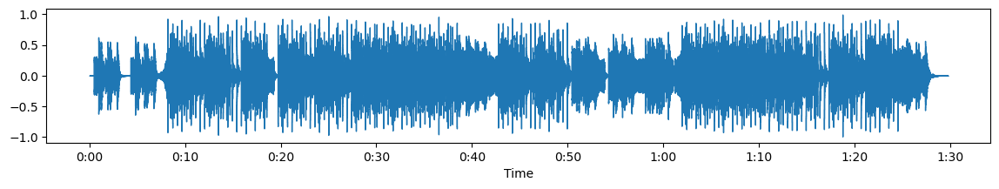

In [2]:
audio = 'C:\\Users\\claud\Desktop\\Extracao_atributos\\audio.mp3'#localização do arquivo mp3 no PC
audio_data, frequency_sample = librosa.load(audio, sr=None) #Dados e Frequencia de amostragem
#y, sr = librosa.load(audio, sr=None)
print(f'Frequência de Amostragem: {frequency_sample}')
plt.figure(figsize=(14,2))
ld.waveshow(audio_data,sr=frequency_sample) 
Audio(audio_data, rate=frequency_sample)

1 - Análise tempo-frequência utilizando Transformada de Fourier de curta duração(STFT) e janelas da ordem de 30ms, Observe e comente os efeitos no espectrograma de variar o tipo de janela e o intervalo de tempo entre janelas adjacentes; 
Definindo intervalo de amostra 30ms e tempo entre janelas de 10ms por meio do hop_length, claculando STFT e exibindo janela

Janelas da ordem de 30ms

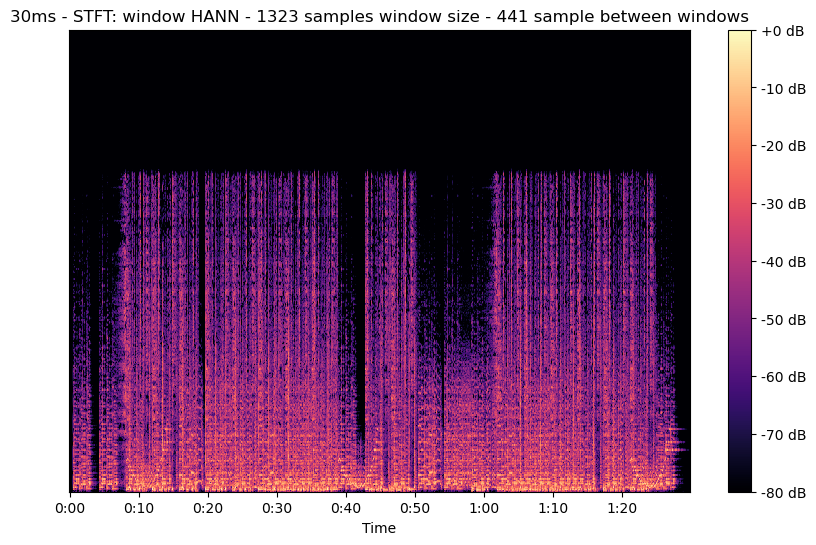

In [3]:
#Janelas da ordem de 30ms
window_size = int(0.03 * frequency_sample)
hop_length = int(frequency_sample * 0.01)
# Analisando Transformada de Fourier de curta duração(STFT)
stft = librosa.stft(audio_data, n_fft=window_size, hop_length=hop_length)
stft_db = librosa.amplitude_to_db(np.abs(stft), ref=np.max)
# Exibir janelas
plt.figure(figsize=(10, 6))
librosa.display.specshow(stft_db, sr=frequency_sample, hop_length=hop_length, x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title(f'30ms - STFT: window HANN - {window_size} samples window size - {hop_length} sample between windows')
plt.show()

2 - Varie a largura da janela entre 10 e 100 ms, observe e comente as difereças entre os espectrogramas obtidos;

Janelas da ordem de 10ms

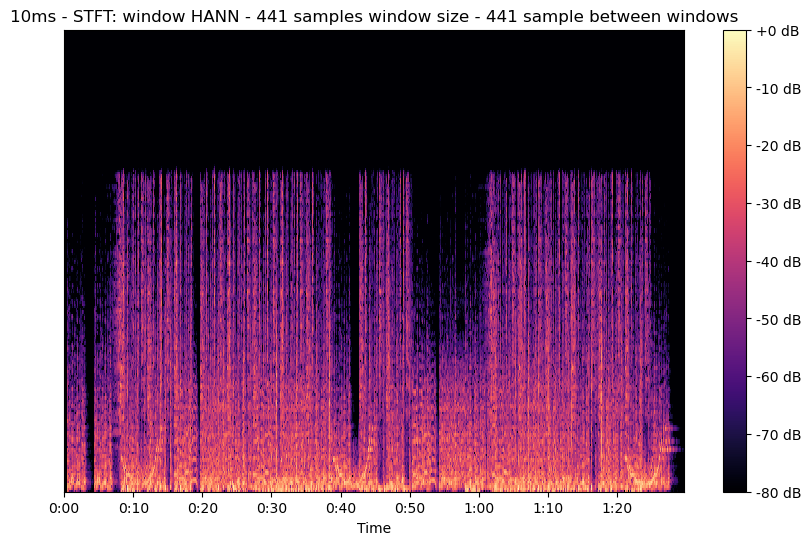

In [4]:
#Janelas da ordem de 10ms
window_size = int(0.01 * frequency_sample)
hop_length = int(frequency_sample * 0.01)
# Analisando Transformada de Fourier de curta duração(STFT)
stft = librosa.stft(audio_data, n_fft=window_size, hop_length=hop_length)
stft_db = librosa.amplitude_to_db(np.abs(stft), ref=np.max)
# Exibir janelas
plt.figure(figsize=(10, 6))
librosa.display.specshow(stft_db, sr=frequency_sample, hop_length=hop_length, x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title(f'10ms - STFT: window HANN - {window_size} samples window size - {hop_length} sample between windows')
plt.show()

Janelas da ordem de 100ms

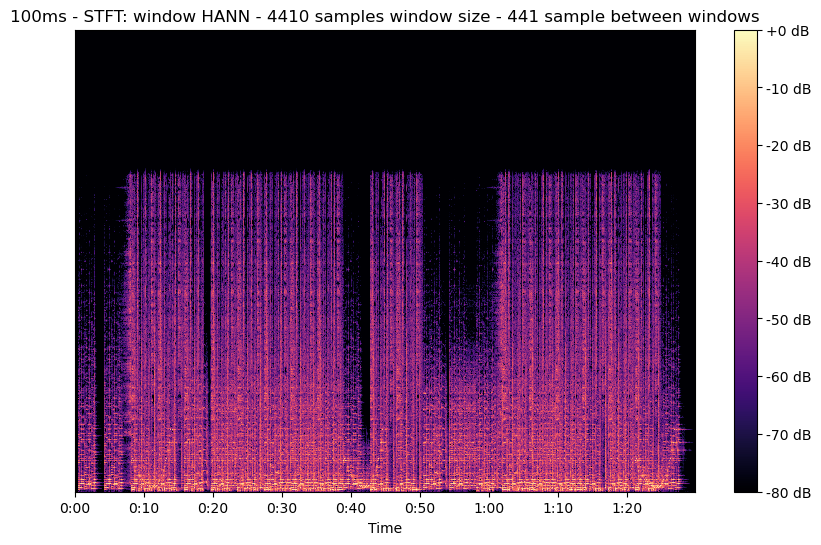

In [5]:
#Janelas da ordem de 100ms
window_size = int(0.1 * frequency_sample)
hop_length = int(frequency_sample * 0.01)
# Analisando Transformada de Fourier de curta duração(STFT)
stft = librosa.stft(audio_data, n_fft=window_size, hop_length=hop_length)
stft_db = librosa.amplitude_to_db(np.abs(stft), ref=np.max)
# Exibir janelas
plt.figure(figsize=(10, 6))
librosa.display.specshow(stft_db, sr=frequency_sample, hop_length=hop_length, x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title(f'100ms - STFT: window HANN - {window_size} samples window size - {hop_length} sample between windows')
plt.show()

3 - Execute uma decomposição DWT com 8 níveis utilizando a função Daubechies 4 como wavelet-mãe, plote os sinais (original e 8 níveis de decomposição) em uma mesma janela, observe, comente e compare com os resultados obtidos na STFT

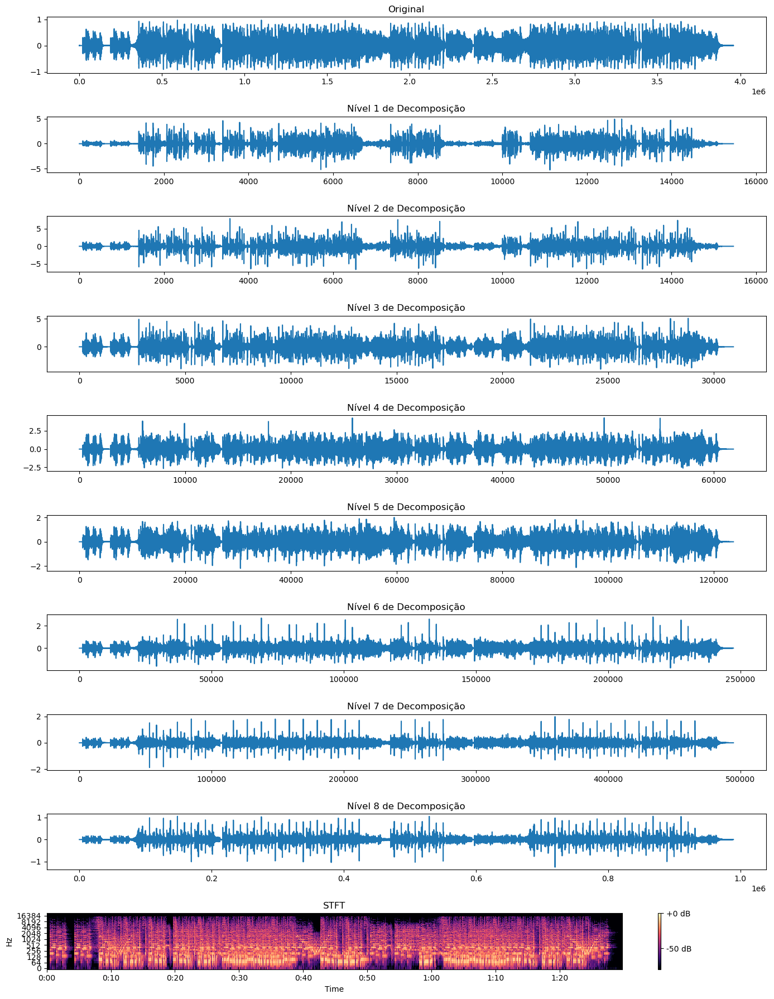

In [6]:
audio_mono = librosa.to_mono(audio_data)
#DWT
nivel = 8
transformada = pywt.wavedec(audio_mono, 'db1', level=nivel)
# Exibindo em os sinais
plt.figure(figsize=(14, 18))
plt.subplot(nivel + 2, 1, 1)
plt.plot(audio_mono)
plt.title('Original')
for i in range(nivel):
    plt.subplot(nivel + 2, 1, i + 2)
    plt.plot(transformada[i])
    plt.title(f'Nível {i+1} de Decomposição')
# Exibindo o espectrograma usando STFT e mostrando o espectro STFT
plt.subplot(nivel + 2, 1, nivel + 2)
spec = librosa.amplitude_to_db(np.abs(librosa.stft(audio_mono)), ref=np.max)
librosa.display.specshow(spec, sr=frequency_sample, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('STFT')
plt.tight_layout()
plt.show()